pystac-client 0.4 used due to depreciation issues

In [2]:
# pip install  pystac-client==0.4

In [3]:
# pip show pystac_client

In [4]:
# imports
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import pathlib
import os
import numpy as np
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio

import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
from rasterio.plot import show

import matplotlib.colors as mcolors
from shapely.geometry import Point

from tqdm import tqdm


In [5]:
# opening STAC catalog

catalog = pystac_client.Client.open(
    "https://storage.googleapis.com/dgds-data-public/gca/SOTC/gca-stac_sotc/catalog.json" # cloud API
    # r"p:\1000545-054-globalbeaches\15_GlobalCoastalAtlas\coclicodata\current\catalog.json" # P drive API 
)
catalog


<Client id=gca-catalog>

In [6]:
list(catalog.get_collections())

[<CollectionClient id=shore_mon_fut>,
 <CollectionClient id=sed_class>,
 <CollectionClient id=shore_mon>,
 <CollectionClient id=world_pop>,
 <CollectionClient id=world_gdp>,
 <CollectionClient id=shore_mon_hr>,
 <CollectionClient id=shore_mon_drivers>,
 <CollectionClient id=esl_gwl>,
 <CollectionClient id=sub_threat>,
 <CollectionClient id=Exp_world_pop>,
 <CollectionClient id=Haz-ESL>,
 <CollectionClient id=Vul-Inf_Mort>,
 <CollectionClient id=Haz-GCM_90-100>,
 <CollectionClient id=Exp-NS_Slopes>,
 <CollectionClient id=Vul_MYS>,
 <CollectionClient id=Vul_RS>,
 <CollectionClient id=Haz-GCM_40-50>,
 <CollectionClient id=Haz-ERA5_04-14>,
 <CollectionClient id=Vul-GDP_Cap>,
 <CollectionClient id=Haz-GCM_04-14>,
 <CollectionClient id=Haz-Land_Sub_2010_COGs>,
 <CollectionClient id=Haz-Land_Sub_2040_COGs>,
 <CollectionClient id=Vul-Roads_Density_COGs>]

In [7]:
collection= catalog.get_child("Haz-Land_Sub_2010_COGs")
collection

<CollectionClient id=Haz-Land_Sub_2010_COGs>

In [8]:
# items=list(collection.get_all_items())
# print(f"Number of items: {len(items)}")


In [9]:

# for item in items:
#     print(f"- {item.id}")

Test getting x-102.0_y-1

In [10]:
lon=-77.56
lat=+18.28
# B01_x12.0_y-70.0
item_name="B01_x-51.0_y50.0"
item=collection.get_item(item_name)
item

<Item id=B01_x-51.0_y50.0>

In [11]:
href=item.assets["band_data"].href
href

'https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2010_COGs/B01_x-51.0_y50.0.tif'

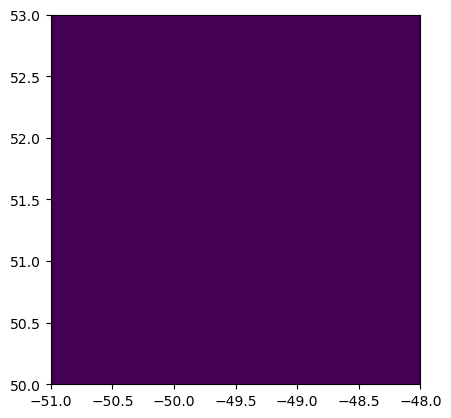

<Axes: >

In [12]:


img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(img)

In [13]:
Land_sub = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -51.0 -50.99 -50.98 -50.97 ... -48.02 -48.01 -48.0
  * y            (y) float64 53.0 52.99 52.98 52.97 ... 50.03 50.02 50.01 50.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

In [14]:
def find_tile_name(latitude, longitude,sample_bottom_left_lon, sample_bottom_left_lat,tile_size):
    # Define the tile size in degrees (3 degrees in both latitude and longitude)
    offset_lon=sample_bottom_left_lon % tile_size
    offset_lat=sample_bottom_left_lat % tile_size

    
    # longitude=np.sign(longitude)*(abs(longitude)-abs(offset_lon))
    # latitude=np.sign(latitude)*(abs(latitude)-abs(offset_lat))
    
    # Calculate the bottom left corner coordinates of the tile positives only
    bottom_left_lon = (longitude // tile_size) * tile_size
    bottom_left_lat = (latitude // tile_size) * tile_size


    # If offset == 0 then perfect
    if offset_lat == 0:
         bottom_left_lat_final=bottom_left_lat
    if offset_lon == 0:
         bottom_left_lon_final=bottom_left_lon

    if offset_lat != 0 :
         bottom_left_lat_final=bottom_left_lat + offset_lat
         if bottom_left_lat_final > latitude:
              bottom_left_lat_final=bottom_left_lat_final-tile_size
    if offset_lon != 0 :
         bottom_left_lon_final=bottom_left_lon + offset_lon
         if bottom_left_lon_final > longitude:
              bottom_left_lon_final=bottom_left_lon_final-tile_size







    # Generate the tile name using the bottom left corner's coordinates
    tile_name = f"B01_x{bottom_left_lon_final:.1f}_y{bottom_left_lat_final:.1f}"

    return tile_name


In [15]:
# (-44.7//3)*3

In [16]:
import numpy as np
lon_x=178.4
lat_y=63.4

lon_x=-124.1
lat_y=78.17

lon_x=-70.5
lat_y=-14.4

lon_x=7.74
lat_y=-44.7

Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
print(f"The point belongs to the tile: {tile_name}")

The point belongs to the tile: B01_x6.0_y-46.0


In [17]:

lon_x=-77.4253
lat_y= 17.8684

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
tile_name


'B01_x-78.0_y17.0'

In [18]:
(17//3)*3

15

In [19]:

href=collection.get_item(tile_name).assets["band_data"].href

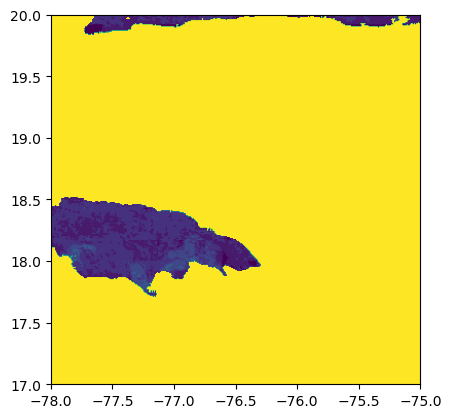

<Axes: >

In [20]:
Land_sub_img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(Land_sub_img)


In [21]:

Land_sub_xr = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub_xr

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -78.0 -77.99 -77.98 -77.97 ... -75.02 -75.01 -75.0
  * y            (y) float64 20.0 19.99 19.98 19.97 ... 17.03 17.02 17.01 17.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

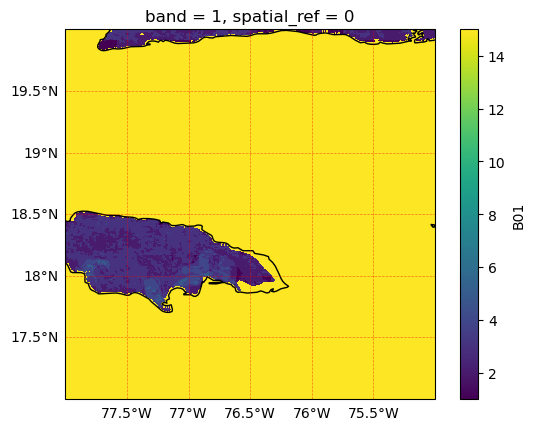

In [22]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the variable
Land_sub_xr["band_data"].plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')

# Show the plot
plt.show()

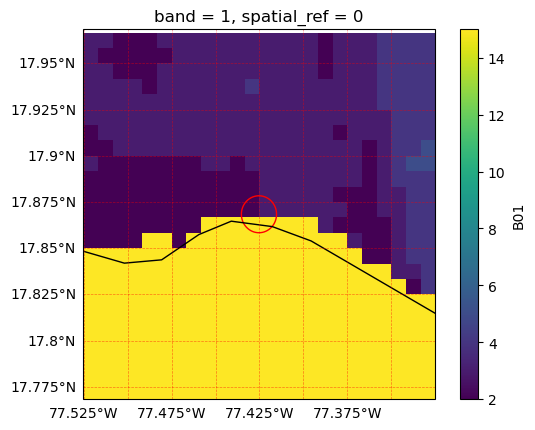

In [23]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# # Adjust these values to zoom in or out as needed
lon_min = lon_x -  0.1
lon_max = lon_x +  0.1
lat_min = lat_y +  0.1
lat_max = lat_y -  0.1
ax.set_extent([lon_min, lon_max, lat_min, lat_max])

# Plot the variable
Land_sub_xr["band_data"].sel(x=slice(lon_x-.1,lon_x+.1),y=slice(lat_y+.1,lat_y-.1)).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')
# Define the point coordinates
lon_x = -77.4253
lat_y =  17.8684

# Create a point geometry
point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

# Plot the GeoDataFrame
# fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
gdf.plot(ax=ax, color='none', edgecolor='red')
# Plot the variable


# Show the plot
plt.show()

In [24]:


search_square=Land_sub_xr["band_data"].sel(x=slice(lon_x-.01,lon_x+.01),y=slice(lat_y+.01,lat_y-.01))
search_square


<xarray.DataArray 'band_data' (band: 1, y: 2, x: 2)>
[4 values with dtype=uint8]
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -77.43 -77.42
  * y            (y) float64 17.87 17.86
    spatial_ref  int32 ...
Attributes: (12/26)
    AREA_OR_POINT:       Area
    AUTHOR:              Department of Earth Sciences, Harvard University
    CITATION:            Gerardo Herrera-García et al. , Mapping the global t...
    COMMENT:             The dataset includes classified probabilities of lan...
    Conventions:         CF-1.8
    CRS:                 EPSG:4326
    ...                  ...
    TITLE_ABBREVIATION:  GSH
    UNITS:               probability levels
    _FillValue:          241
    scale_factor:        1.0
    add_offset:          0.0
    long_name:           B01

In [25]:

search_square.values = np.where(search_square.values != 15, search_square.values, np.nan)
search_square.values
search_square
# search_square


<xarray.DataArray 'band_data' (band: 1, y: 2, x: 2)>
array([[[ 2.,  3.],
        [nan, nan]]])
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -77.43 -77.42
  * y            (y) float64 17.87 17.86
    spatial_ref  int32 ...
Attributes: (12/26)
    AREA_OR_POINT:       Area
    AUTHOR:              Department of Earth Sciences, Harvard University
    CITATION:            Gerardo Herrera-García et al. , Mapping the global t...
    COMMENT:             The dataset includes classified probabilities of lan...
    Conventions:         CF-1.8
    CRS:                 EPSG:4326
    ...                  ...
    TITLE_ABBREVIATION:  GSH
    UNITS:               probability levels
    _FillValue:          241
    scale_factor:        1.0
    add_offset:          0.0
    long_name:           B01

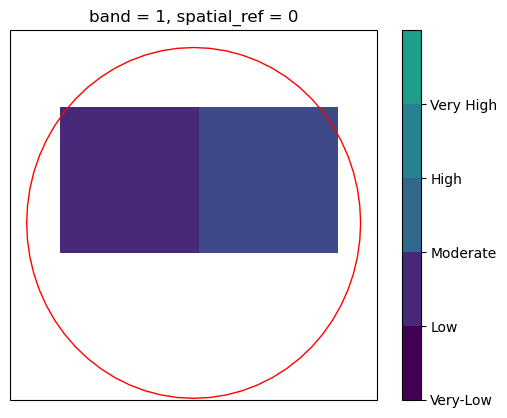

In [33]:
colors = ['#440154', '#482878', '#3e4989', '#31688e', '#26828e', '#1f9e89']
risk_levels = ['Very-Low', 'Low', 'Moderate', 'High', 'Very High']

cmap = mcolors.ListedColormap(colors)

# Create color bar
norm = mcolors.Normalize(vmin=1, vmax=6)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Create a new Axes for the Colorbar
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})

cbar = fig.colorbar(sm, ticks=range(1, 6), ax=ax, boundaries=range(1, 7))
cbar.ax.set_yticklabels(risk_levels)

search_square.plot(ax=ax, cmap=cmap, vmin=1, vmax=6, add_colorbar=False)

point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a 1000m = 0.01degrees buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

gdf.plot(ax=ax, color='none', edgecolor='red')  # Create a point geometry

plt.show()

In [45]:
filtered_df=search_square.to_dataframe()
filtered_df#.drop("spatial_ref")

spatial_ref  band_data
band y         x                                 
1    17.870833 -77.429167            0        2.0
               -77.420833            0        3.0
     17.862500 -77.429167            0        NaN
               -77.420833            0        NaN

In [49]:
np.ceil(filtered_df["band_data"].mean())

3.0

In [87]:
# Convert the index into a column
filtered_df.reset_index(inplace=True)

# Rename the new index column if needed
filtered_df.rename(columns={'index': 'index1'}, inplace=True)
filtered_df

,index1,band,y,x,spatial_ref,band_data
0,0,1,17.870833,-77.429167,0,2
1,1,1,17.870833,-77.420833,0,3
2,2,1,17.862500,-77.429167,0,15
3,3,1,17.862500,-77.420833,0,15


In [96]:
geometry = [Point(xy) for xy in zip(filtered_df['y'], filtered_df['x'])]

In [102]:
gdf = gpd.GeoDataFrame(filtered_df, geometry=geometry, crs="EPSG:4326")
gdf

,index1,band,y,x,spatial_ref,band_data,geometry
0,0,1,17.870833,-77.429167,0,2,POINT (17.87083 -77.42917)
1,1,1,17.870833,-77.420833,0,3,POINT (17.87083 -77.42083)
2,2,1,17.862500,-77.429167,0,15,POINT (17.86250 -77.42917)
3,3,1,17.862500,-77.420833,0,15,POINT (17.86250 -77.42083)


In [103]:
gdf = gdf.loc[:, ['geometry', 'band_data']]
gdf

,geometry,band_data
0,POINT (17.87083 -77.42917),2
1,POINT (17.87083 -77.42083),3
2,POINT (17.86250 -77.42917),15
3,POINT (17.86250 -77.42083),15


TypeError: unhashable type: 'dict'

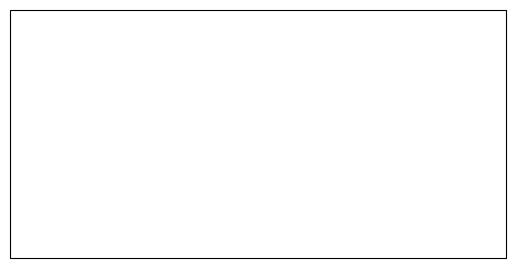

In [112]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import cartopy.crs as ccrs
import xarray as xr
import numpy as np

# Assuming 'Land_sub_xr' is your xarray Dataset and it has a 'band_data' variable
# lon_x and lat_y are the coordinates you're interested in

# Define the custom color map
risk_colors = {
    1: '#008000',  # Low risk - Green
    2: '#FFFF00',  # Moderate risk - Yellow
    3: '#FFA500',  # High risk - Orange
    4: '#FF4500',  # Very high risk - Dark Orange
    5: '#8B0000',  # Extreme risk - Red
    6: '#808080',  # No data available - Gray
}

# Select the data
search_square = Land_sub_xr["band_data"].sel(x=slice(lon_x-.01,lon_x+.01), y=slice(lat_y+.01,lat_y-.01))

# Create a plot
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the data with a discrete color map
# First, we need to convert the data to a categorical type to use a discrete color map
# Assuming 'search_square' is a  2D array of risk levels, we can convert it to a categorical type
risk_levels = ['Low', 'Moderate', 'High', 'Very High', 'Extreme', 'No Data']
search_square_cat = np.select([search_square == level for level in range(1,  7)], risk_levels, default='No Data')

# Now, create a color map from the risk_colors dictionary
custom_cmap = {risk_levels[i]: risk_colors[i+1] for i in range(len(risk_levels))}

# Plot the data
search_square.plot(ax=ax, cmap=custom_cmap, add_colorbar=True)

# Create a GeoDataFrame from the point
point = Point(lon_x, lat_y)
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

# Plot the point
gdf.plot(ax=ax, color='none', edgecolor='red')

plt.show()


In [119]:
import matplotlib.pyplot as plt

import geopandas as gpd

import geopandas as gpd
import cartopy.crs as ccrs
import xarray as xr

search_square = Land_sub_xr["band_data"].sel(x=slice(lon_x-.01,lon_x+.01), y=slice(lat_y+.01,lat_y-.01))
df = search_square.to_dataframe()

# Now you can apply your categorization logic to the DataFrame
search_square_categorized = df.astype(int).applymap(lambda x: x if x !=  15 else np.nan)

# Define categories and their labels
categories = [1,  2,  3,  4,  5,  6]
labels = ['Very Low Risk', 'Low Risk', 'Medium Risk', 'High Risk', 'Very High Risk', 'No Data Available']

# Categorize the data
search_square_categorized_cat = pd.cut(search_square_categorized, bins=categories, labels=labels)

# Create a discrete color map
colors = ['#440154', '#482878', '#3e4989', '#31688e', '#26828e', '#1f9e89', '#66c2a4']
cmap = mcolors.ListedColormap(colors)

# Plot the categorized data
ax = plt.axes(projection=ccrs.PlateCarree())
search_square_categorized_cat.plot(ax=ax, cmap=cmap, legend=True, legend_kwds={'loc': 'upper right', 'title': 'Risk Level'})

# Assuming 'lon_x' and 'lat_y' are your coordinates
point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

gdf.plot(ax=ax, color='none', edgecolor='red')

plt.show()


C:\Users\rowe\AppData\Local\Temp\ipykernel_6988\1398007799.py:13: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  search_square_categorized = df.astype(int).applymap(lambda x: x if x !=  15 else np.nan)


ValueError: Input array must be 1 dimensional

In [120]:
df

spatial_ref  band_data
band y         x                                 
1    17.870833 -77.429167            0          2
               -77.420833            0          3
     17.862500 -77.429167            0         15
               -77.420833            0         15